# A Case Study For Predicting House Prices for Hass Consultant Ltd from 1990 - 2020

 ## Define the Question?
 
 
 >You have been tasked to study the factors that affect housing prices using the given information on real estate properties that was collected over the past few months. Later onwards, create a model that would allow the company to accurately predict the sale of prices upon being provided with the predictor variables. 

### b) Defining the Metric for Success

 > - Create  regression models that predict how much a price will be worth with an RMSE score that is less than a fifth of the mean.


### c) Understanding the context 
>Context 
- The dataset to use for this project can be found by following this link: [http://bit.ly/IndependentProjectWeek7Dataset]. 
> Below is the dataset glossary:
id : A notation for a house

date: Date house was sold

price: Price is prediction target

bedrooms: Number of bedrooms

bathrooms: Number of bathrooms

sqft_living: Square footage of the home

sqft_lot: Square footage of the lot

floors :Total floors (levels) in house

waterfront :House which has a view to a waterfront

view: Has been viewed

condition :How good the condition is overall

grade: overall grade given to the housing unit

sqft_above : Square footage of house apart from basement

sqft_basement: Square footage of the basement

yr_built : Built Year

yr_renovated : Year when house was renovated

zipcode: Zip code

lat: Latitude coordinate

long: Longitude coordinate

sqft_living15  

sqft_lot15 



### d) Recording the Experimental Design
> Expected flow for the assessment:
Perform your EDA
Perform any necessary feature engineering 
Check of multicollinearity
Start building the model
Cross-validate the model
Compute RMSE
Create residual plots for your models, and assess their heteroscedasticity using Bartlett’s test
Perform appropriate regressions on the data including your justification
Challenge your solution by providing insights on how you can make improvements.

## Reading the Data

In [1]:
# Loading libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
# Previewing the data

hass = pd.read_csv('http://bit.ly/IndependentProjectWeek7Dataset')
hass.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Checking the Data

In [3]:
# Lets check the shapes of our dataset and display the results

print('Shape of Hass Dataset :', 'The Hass dataset has ', hass.shape[0],' rows and ', hass.shape[1],' columns')

Shape of Hass Dataset : The Hass dataset has  21613  rows and  20  columns


In [4]:
# Checking whether each column has an appropriate datatype
#
hass.dtypes

id                 int64
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [5]:
hass.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   price          21613 non-null  float64
 2   bedrooms       21613 non-null  int64  
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  int64  
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     21613 non-null  int64  
 8   view           21613 non-null  int64  
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  int64  
 11  sqft_above     21613 non-null  int64  
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  zipcode        21613 non-null  int64  
 16  lat            21613 non-null  float64
 17  long           21613 non-null  float64
 18  sqft_l

## Tidying the Dataset

In [6]:
# Lets check for null values in the ranks dataset

hass.isnull().sum()

id               0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [7]:
# Checking for duplicated values
# 
hass.duplicated().sum()

3

In [8]:
# We will now drop the duplicate rows
# 

hass.drop_duplicates(inplace=True)

In [9]:
#  Describe Numerical variables
# 
hass.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21610.0,4.580161e+09,2.876547e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21610.0,5.401789e+05,3.673876e+05,7.500000e+04,3.216125e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21610.0,3.370847e+00,9.301097e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21610.0,2.114739e+00,7.702037e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21610.0,2.079881e+03,9.185003e+02,2.900000e+02,1.425500e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21610.0,1.510829e+04,4.142323e+04,5.200000e+02,5.040000e+03,7.619000e+03,1.068875e+04,1.651359e+06
floors,21610.0,1.494239e+00,5.399935e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21610.0,7.542804e-03,8.652316e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21610.0,2.341971e-01,7.661365e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21610.0,3.409440e+00,6.507639e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


In [10]:
#  Dropping irrelevant columns

hass.drop(['id','lat','long'], axis=1, inplace=True)


In [11]:
# The columns
# Splitting categorical and numerical columns
categorical = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition', 'grade']
continous = ['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'sqft_living15', 'sqft_lot15']

### Dealing with Outliers
Outliers should be kept if they have the potential to reveal useful information about relationships in our data. There are two variables in this dataset, however, whose outliers should be removed: bedrooms and bathrooms. If a residence in the dataset has more than 5 bathrooms or more than 10 bedrooms, we're likely not dealing with single-family homes, but much larger units that would be better to analyze separately. For this reason, we'll remove all rows in the data that contain outlier values for these columns.

In [12]:
count = 0
bath_outliers = []
mean = np.mean(hass['bathrooms'])
max_distance = np.std(hass['bathrooms']) * 3 

for idx, row in hass['bathrooms'].T.iteritems():
    if abs(row-mean) >= max_distance:
        count += 1
        hass.drop(idx, inplace=True)
count

187

In [13]:
count = 0
bed_outliers = []
mean = np.mean(hass['bedrooms'])
max_distance = np.std(hass['bedrooms']) * 3 

for idx, row in hass['bedrooms'].T.iteritems():
    if abs(row-mean) >= max_distance:
        count += 1
        hass.drop(idx,inplace=True)
count

60

## Exploratory Data Analysis
> This involves Univariate, Bivariate and Multi-variate Analysis

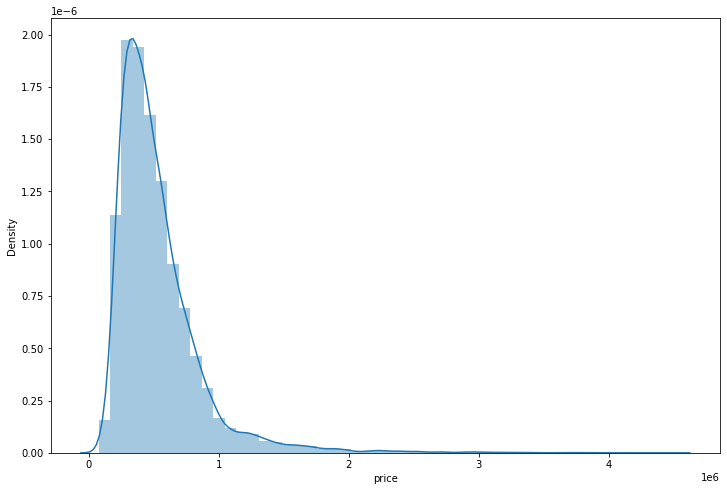

In [14]:
#  House Price Distribution
# 

plt.figure(figsize = (12,8))
sns.distplot(hass['price'])
plt.show()

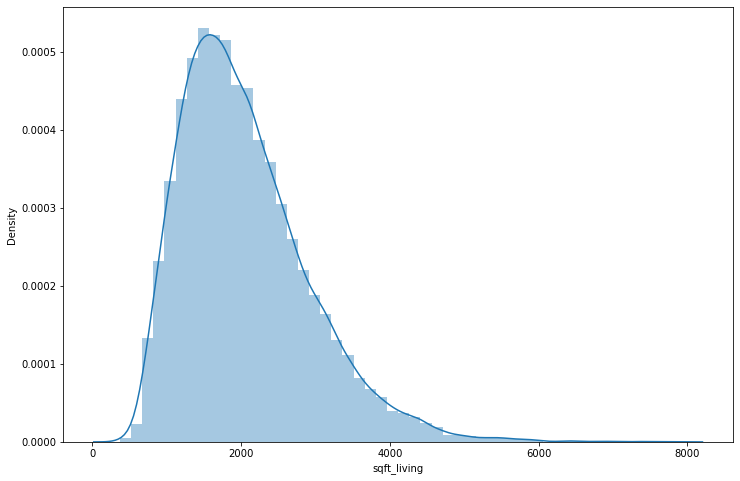

In [15]:
# Living Space Distribution
# 
plt.figure(figsize = (12,8))
sns.distplot(hass['sqft_living'])
plt.show()

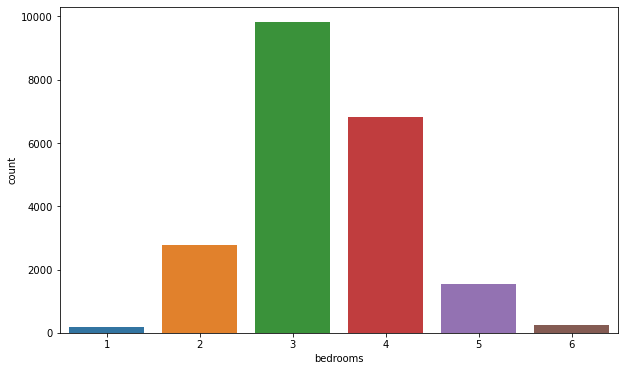

In [16]:
# Bedrooms
# 

plt.figure(figsize = (10,6))
sns.countplot(hass['bedrooms'])
plt.show()

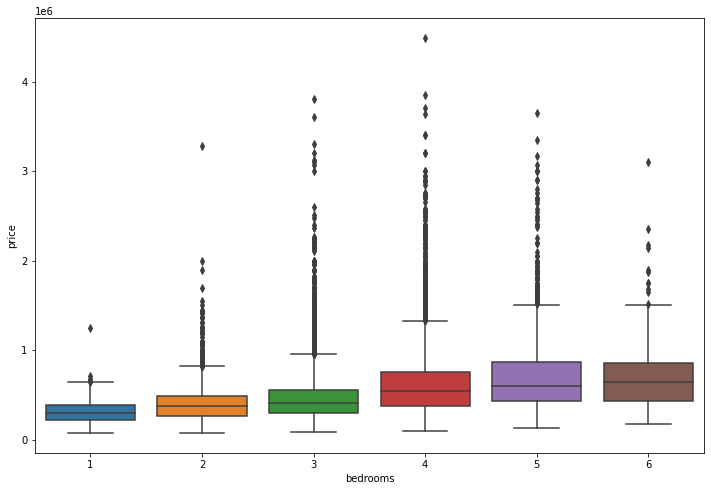

In [17]:
# Checking Bedrooms against price
# 

plt.figure(figsize = (12,8))
sns.boxplot(x='bedrooms',y='price',data=hass)
plt.show()

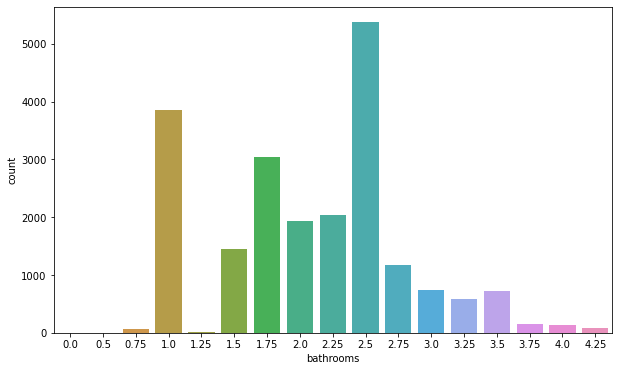

In [18]:
# Bathrooms 
# 
plt.figure(figsize = (10,6))
sns.countplot(hass['bathrooms'])
plt.show()


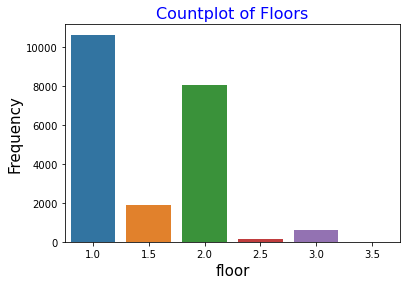

In [19]:
# Checking the floors column
# 
sns.countplot(x='floors',data=hass, palette= "tab10")
plt.xlabel("floor",fontsize=15)
plt.ylabel("Frequency",fontsize=15)
plt.title("Countplot of Floors",fontsize=16,color="b")
plt.show()

In [20]:
# Checking the condition column
# 
hass.condition.unique()
#The condition values from 1 to 5

array([3, 5, 4, 1, 2], dtype=int64)

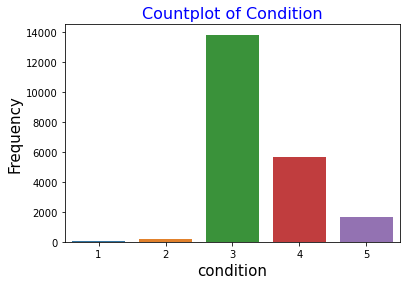

In [21]:
#visualizing the distribution of the condition of houses
sns.countplot('condition',data = hass)
plt.xlabel("condition",fontsize=15)
plt.ylabel("Frequency",fontsize=15)
plt.title("Countplot of Condition",fontsize=16,color="b")
plt.show()

In [22]:
# Checking Grade Column 
# There are 11 unique grades in the system 
hass.grade.nunique()

11

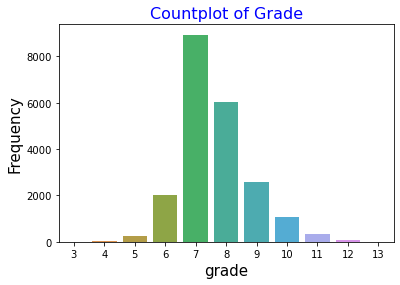

In [23]:
#visualizing the distribution of the condition of houses
sns.countplot('grade',data = hass)
plt.xlabel("grade",fontsize=15)
plt.ylabel("Frequency",fontsize=15)
plt.title("Countplot of Grade",fontsize=16,color="b")
plt.show()
#The Grade with the highest count is 7 followed by 8.

In [24]:
hass.yr_built.unique()
#the data is for houses built between 1935 and 1955

array([1955, 1951, 1933, 1965, 1987, 1995, 1963, 1960, 2003, 1942, 1927,
       1977, 1900, 1979, 1994, 1916, 1921, 1969, 1947, 1968, 1985, 1941,
       1915, 1909, 1948, 2005, 1929, 1981, 1930, 1904, 1996, 2000, 1984,
       2014, 1922, 1959, 1966, 1953, 1950, 2008, 1991, 1954, 1973, 1925,
       1989, 1972, 1986, 1956, 2002, 1992, 1964, 1952, 1961, 2006, 1988,
       2001, 1962, 1939, 1946, 1967, 1975, 1980, 1910, 1983, 1978, 1905,
       1971, 2010, 1945, 1924, 1990, 1914, 1926, 2004, 1923, 2007, 1976,
       1949, 1999, 1901, 1993, 1920, 1997, 1943, 1957, 1940, 1918, 1928,
       1974, 1911, 1936, 1937, 1982, 1908, 1931, 1998, 1913, 2013, 1907,
       1958, 2012, 1912, 2011, 1917, 1932, 1944, 1902, 2009, 1903, 1970,
       2015, 1934, 1938, 1919, 1906, 1935], dtype=int64)

In [25]:
hass.yr_renovated.value_counts(normalize=True)
# 95% are 0's hence not so relevant

0       0.958339
2014    0.004260
2013    0.001685
2007    0.001592
2005    0.001592
          ...   
1944    0.000047
1934    0.000047
1948    0.000047
1951    0.000047
1954    0.000047
Name: yr_renovated, Length: 70, dtype: float64

In [26]:
hass.view.value_counts(normalize=True)
# 90% are 0's

0    0.904367
2    0.043720
3    0.022843
1    0.015307
4    0.013762
Name: view, dtype: float64

In [27]:
hass.waterfront.value_counts(normalize=True)
# 99% are 0' hence not so relevant 

0    0.993025
1    0.006975
Name: waterfront, dtype: float64

In [28]:
#  Dropping irrelevant columns since they do not provide relevant info

hass.drop(['waterfront','view','yr_renovated'], axis=1, inplace=True)

In [29]:
# Preview changes
hass.head(1)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,sqft_living15,sqft_lot15
0,221900.0,3,1.0,1180,5650,1.0,3,7,1180,0,1955,98178,1340,5650


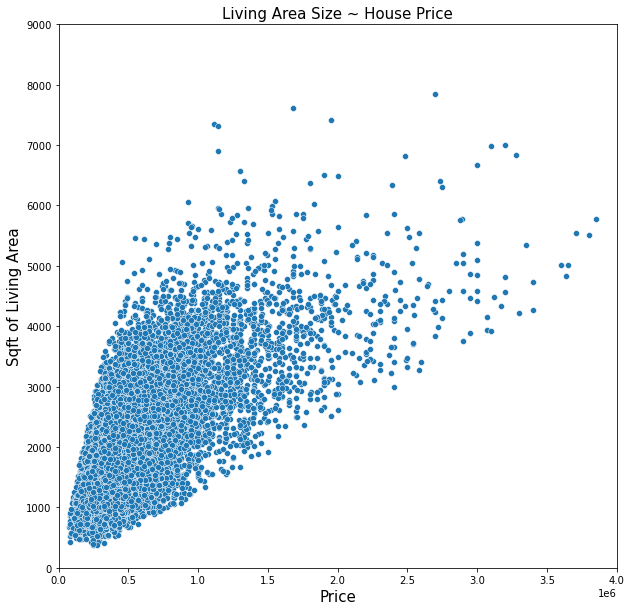

In [30]:
# Scatter plot for living area distribution and price
# 

plt.figure(figsize=(10,10))
sns.scatterplot(hass.price, hass.sqft_living)
plt.xlim(0,4000000)
plt.ylim(0,9000)
plt.title('Living Area Size ~ House Price', size=15)
plt.ylabel('Sqft of Living Area', size=15)
plt.xlabel('Price', size=15)
plt.show()

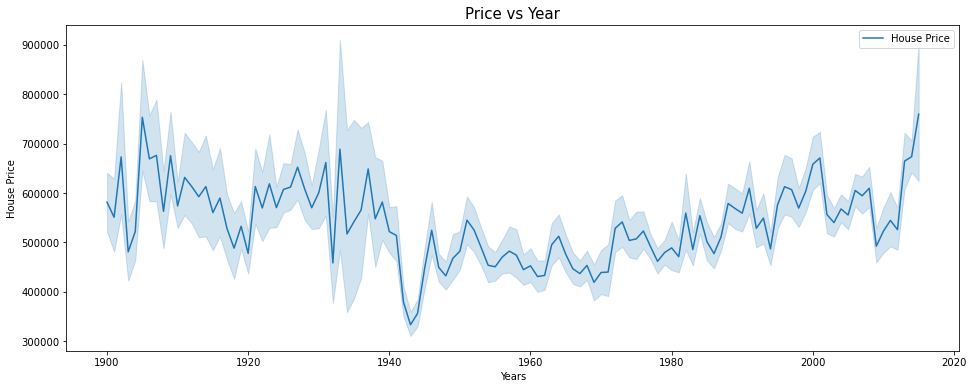

(<matplotlib.legend.Legend at 0x2a1e6150f70>, None)

In [31]:
# Trends in price change over the years
# 
plt.figure(figsize=(16,6))
plt.title('Price vs Year', fontdict={'fontsize': 15}), plt.xlabel('Years'), plt.ylabel('House Price')
sns.lineplot(hass.yr_built, hass.price, label='House Price')
plt.legend(), plt.show()

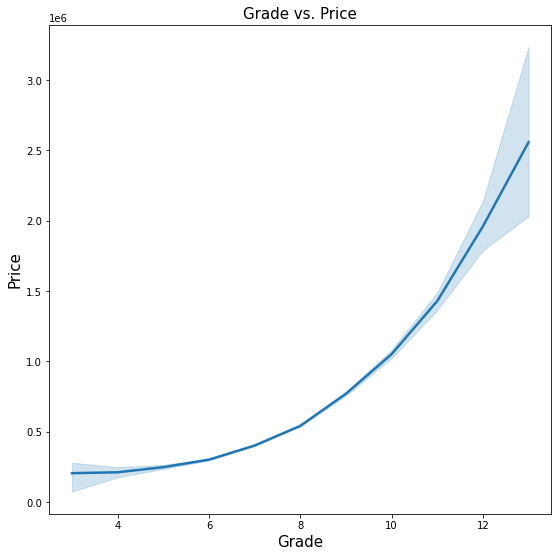

In [32]:
# Use a line plot to display grade and price
plt.figure(figsize=(9,9))
sns.lineplot(x = "grade", y = "price", data=hass, linewidth=2.5)
plt.title('Grade vs. Price', fontsize=15)
plt.xlabel('Grade', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.rc('xtick', labelsize=15) 
plt.rc('ytick', labelsize=15)
plt.show()

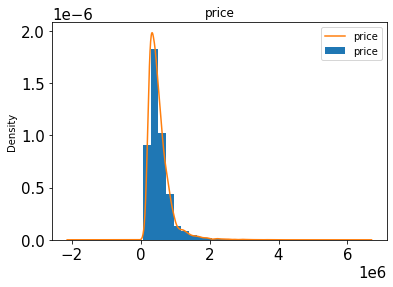

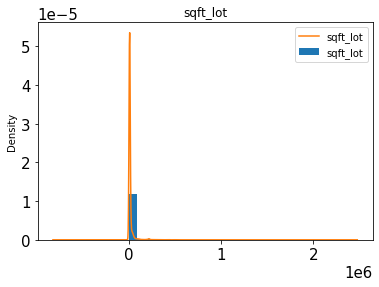

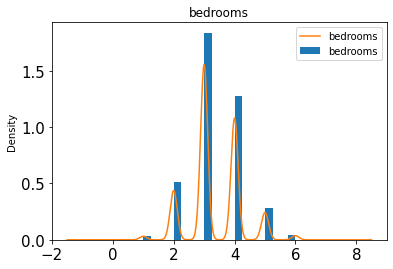

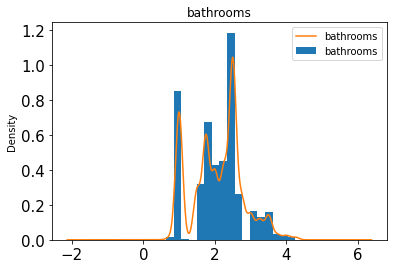

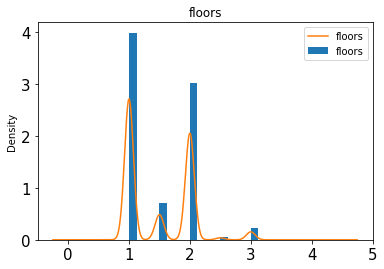

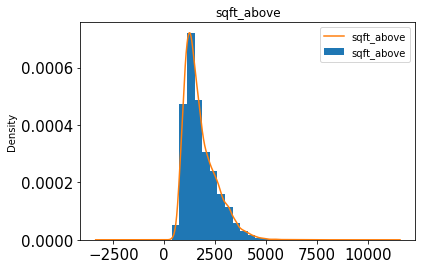

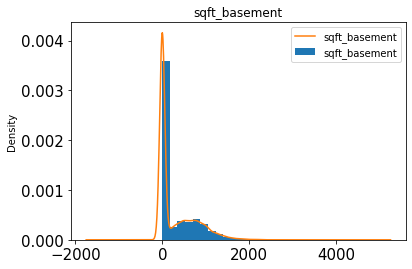

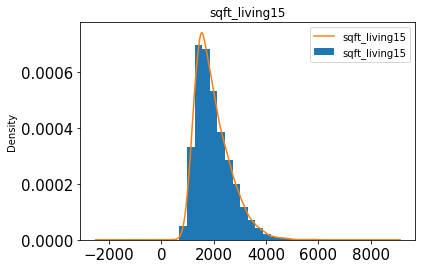

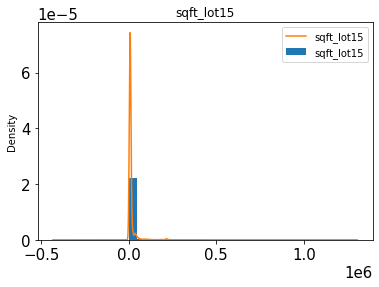

In [33]:
# Plot a KDE for columns in dataset
for column in ['price', 'sqft_lot', 'bedrooms', 'bathrooms', 'floors',  
                   'sqft_above', 'sqft_basement','sqft_living15', 'sqft_lot15']:
    hass[column].plot.hist(density = True, bins = 20)
    hass[column].plot.kde(label = column)
    plt.title(column)
    plt.legend()
    plt.show()

In reviewing these histogram plots, it's clear to notice that there is positive skew in most of the data. This is resulting from an excess of housing prices and size in square feet of the houses/lot lying a few postive standard deviations from the mean. The peaks within these plots display where the values are concentrated over the interval. The peaks in price and square feet lie slightly below zero.


### Checking Correlations and Multicollinearity
We're interested in finding out which variables are most strongly correlated with price, as these variables will be good candidates for inclusion in our model. One of the assumptions of a multiple linear regression model, however, is that there is no multicollinearity among the explanatory variables (i.e., they can't be predicted by other explanatory variables with high accuracy). Below, we create a correlation matrix of price and continuous variables in the dataset to visualize correlations.

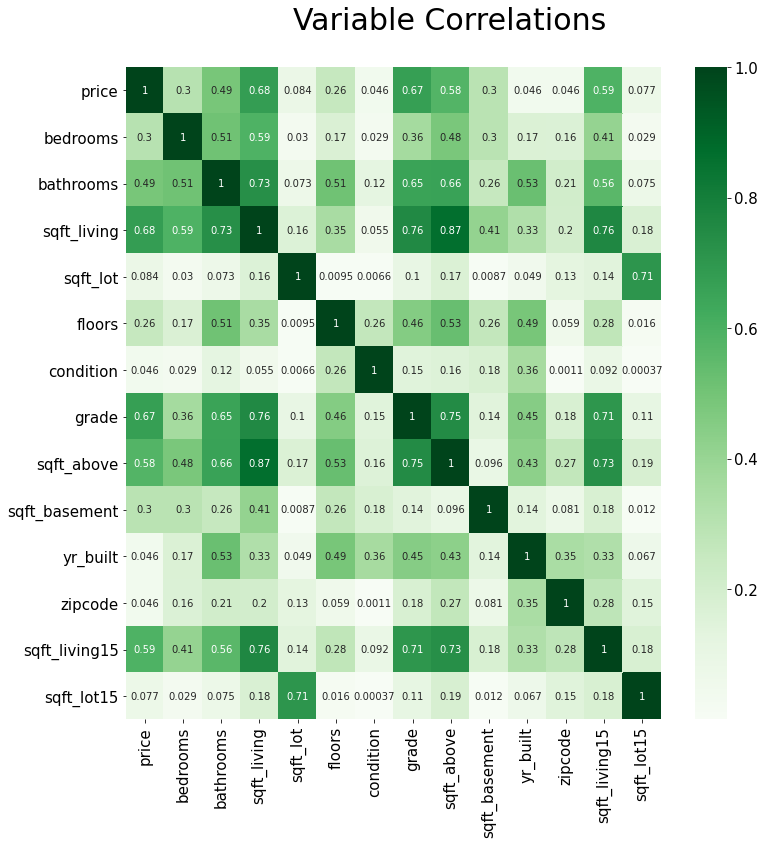

In [34]:

corr = hass.corr().abs()
fig, ax=plt.subplots(figsize=(12,12))
fig.suptitle('Variable Correlations', fontsize=30, y=.95)
heatmap = sns.heatmap(corr, cmap='Greens', annot=True)
heatmap
plt.show()

In [35]:
features = []
correlations = []
for idx, correlation in corr['price'].T.iteritems():
    if correlation >= .30 and idx != 'price':
        features.append(idx)
        correlations.append(correlation)
corr_price_df = pd.DataFrame({'Correlations':correlations, 'Features': features}).sort_values(by=['Correlations'], ascending=False)

In [36]:

Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.iteritems():
        if correlation >= .80 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features}).sort_values(by=['Correlations'], ascending=False)

In [37]:
print('Correlations with Price')
display(corr_price_df)
print('Multicollinear Features')
display(MC_df)

Correlations with Price


,Correlations,Features
2,0.677607,sqft_living
3,0.668201,grade
5,0.593727,sqft_living15
4,0.578401,sqft_above
1,0.489135,bathrooms
0,0.302229,bedrooms


Multicollinear Features


,Correlations,Features
0,0.86693,"[sqft_living, sqft_above]"
1,0.86693,"[sqft_above, sqft_living]"


In [38]:
hass.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built',
       'zipcode', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

# Standardising the data to mitigate skewness and kurtosis
> - ### Let's normalise the price and sqft_living feature
- ### We'll fix it by taking the log and fitting the plot to a normal distribution curve

In [39]:
#applying log transformation
hass['price'] = np.log(hass['price'])


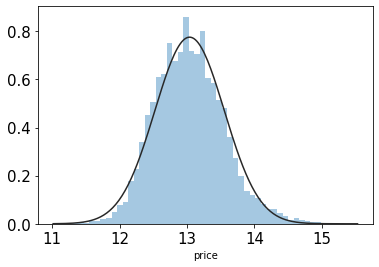

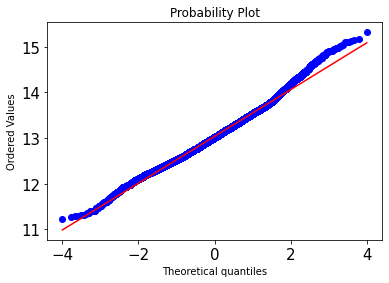

In [40]:
#transformed histogram and normal probability plot
from scipy.stats import norm
from scipy import stats

sns.distplot(hass['price'], fit=norm,  bins=50, kde=False);
fig = plt.figure()
res = stats.probplot(hass['price'], plot=plt)

In [41]:
#applying log transformation
hass['sqft_living'] = np.log(hass['sqft_living'])

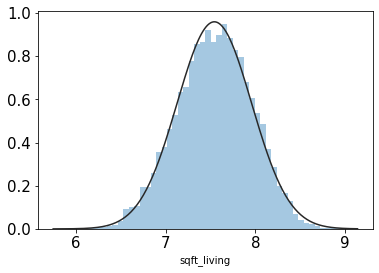

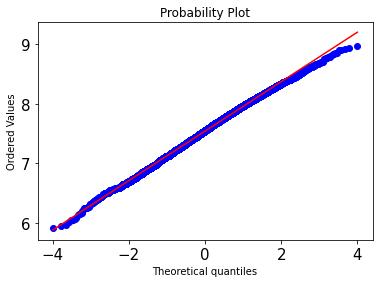

In [42]:
#transformed histogram and normal probability plot
sns.distplot(hass['sqft_living'], fit=norm, bins=50, kde=False);
fig = plt.figure()
res = stats.probplot(hass['sqft_living'], plot=plt)

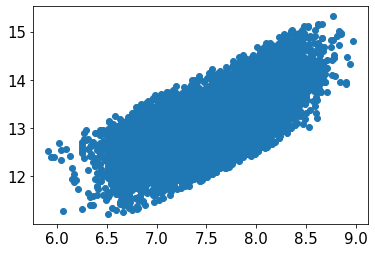

In [43]:
#scatter plot
plt.scatter(hass['sqft_living'], hass['price']);
#Now there is a nice linear relationship between the features

# Multiple Linear Regression

In [44]:
# Preparing the Data
# ---
# Dividing the data into attributes and labels as we did previously. 
# However, unlike last time, this time around we are going to use column names for creating an attribute set and label.
# ---
# 

X = hass.drop(['price'],axis=1)
y = hass['price']

In [45]:
# Dividing our data into training and test sets
# ---
# 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [46]:
# Training the Algorithm
# ---
# To train the algorithm we execute the same code as before, using the fit() method of the LinearRegression class
# ---
# 
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [47]:
# In case of multivariable linear regression, the regression model has to 
# find the most optimal coefficients for all the attributes. 
# To see what coefficients our regression model has chosen, execute the following
# 
coeff_df = pd.DataFrame(regressor.coef_, X.columns, columns=['Coefficient'])
coeff_df


,Coefficient
bedrooms,-4.387280e-02
bathrooms,8.003137e-02
sqft_living,1.773253e-01
sqft_lot,2.671023e-07
floors,1.175012e-01
condition,4.040888e-02
grade,2.085538e-01
sqft_above,3.867274e-05
sqft_basement,1.391083e-04
yr_built,-5.650895e-03


In [48]:
# Making Predictions
# ---
# To make pre-dictions on the test data, execute the following
# ---
# 
y_pred = regressor.predict(X_test)

# To compare the actual output values for X_test with the predicted values
# 
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df

,Actual,Predicted
10974,12.899220,13.123824
7786,12.628067,12.933817
5703,12.886641,12.686133
3748,14.711599,13.663020
9038,12.894182,12.770338
...,...,...
12825,13.304602,12.764897
16782,11.918391,12.347317
3691,12.100434,12.661561
160,12.449019,12.815571


In [49]:
# Evaluating the Algorithm
# ---
# 
from sklearn.metrics import r2_score, mean_squared_error
print(f"R2 score: {r2_score(y_test, y_pred)}")

# Our model gives about 63% Accuracy.

R2 score: 0.6336511465197816


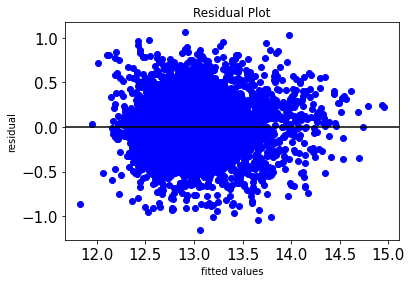

In [50]:
# Residual plot for Multiple-Linear Regression
residuals = y_pred - y_test

# Plotting the prediction errors

plt.scatter(y_pred, residuals, color='blue')
plt.title('Residual Plot')
plt.ylabel('residual')
plt.xlabel('fitted values')
plt.axhline(y= residuals.mean(), color='black')
plt.show()

# Checking for Heteroskedasticity using Barlette's Test
The concept of heteroscedasticity - the opposite being homoscedasticity - is used in statistics, especially in the context of linear regression or for time series analysis, to describe the case where the variance of errors or the model is not the same for all observations, while often one of the basic assumption in modeling is that the variances are homogeneous and that the errors of the model are identically distributed.

The barlett'stest establishes as a null hypothesis that the variance is equal for all our datapoints,and the new hypothesis that the variance is different for at least one pair of datapoints

In [51]:
## Performing the barlett's test
import scipy as sp
test_result, p_value = sp.stats.bartlett(y_pred, residuals)

# Calculating the critical value of the chi squared distribution, to compare it with the test_result
#
degrees_of_freedom = len(y_pred) - 1
probability =  1 - p_value
critical_value = sp.stats.chi2.ppf(probability, degrees_of_freedom)

# If the test_result is greater than the critical value, then the null hypothesis is
# rejected. This means that there are patterns to the variance of the data

# Otherwise, if no patterns are identified, null hypothesis is accepted. This means that 
# the variance is homogeneous across the dataset

if (test_result > critical_value):
  print(f'The test result of {np.round(test_result,2)} is greater than the critical value of {np.round(critical_value, 2)}')
  print('Thefore the variances are unequal, which means that the model should be reassessed')
  print('The variances are heterogenous')
else:
  print(f'The test result of {np.round(test_result,2)} is less than the critical value of {np.round(critical_value, 2)}')
  print('Thefore the variances are equal, which means that the model is ok. No need to reasses')
  print('The variances are homogeneous')

The test result of 327.26 is less than the critical value of inf
Thefore the variances are equal, which means that the model is ok. No need to reasses
The variances are homogeneous


# Quantile regression

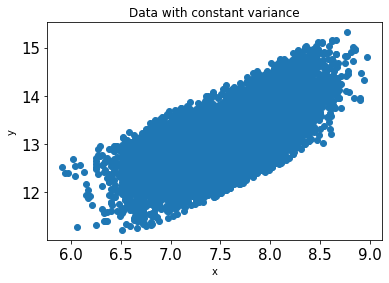

In [52]:
# Preparing the Data
# ---
# Dividing the data into attributes and labels as we did previously. 
# However, unlike last time, this time around we are going to use column names for creating an attribute set and label.
# ---
# 

x = hass["sqft_living"].values.reshape(-1, 1)
y = hass['price']
plt.figure(1)
plt.scatter(x, y)
plt.xlabel("x")
plt.ylabel("y")
plt.title("Data with constant variance")
plt.show()

In [53]:
from sklearn.linear_model import LinearRegression

model1 = LinearRegression(fit_intercept = True, normalize = False)
model1.fit(x, y)

y_pred1 = model1.predict(x)

print("Mean squared error: {0:.2f}"
      .format(np.mean((y_pred1 - y) ** 2)))
print('Variance score: {0:.2f}'.format(model1.score(x, y)))

Mean squared error: 0.15
Variance score: 0.44


In [54]:
from sklearn.linear_model import LinearRegression
clr = LinearRegression()
clr.fit(x, y)

LinearRegression()

Text(0.5, 1.0, 'Linear regression')

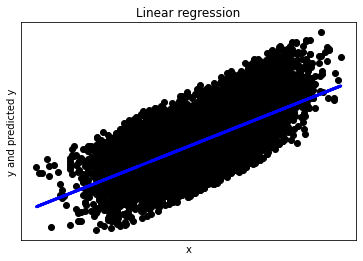

In [56]:
## Plotting the regression
plt.figure(2)
plt.scatter(x, y,  color='black')
plt.plot(x, y_pred1, color='blue',
         linewidth=3)

plt.xticks(())
plt.yticks(())
plt.xlabel("x")
plt.ylabel("y and predicted y")
plt.title("Linear regression")
plt.show()

In [65]:
# We will use the python package statsmodels for Quantile Regression
#
import statsmodels.formula.api as smf

# Finding the regression coefficients for the conditioned median, 0.5 quantile
#
mod = smf.quantreg('price ~ sqft_living', hass)
res = mod.fit(q=.5)

# Then print out the summary of our model
#
print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                  price   Pseudo R-squared:               0.2301
Model:                       QuantReg   Bandwidth:                     0.07207
Method:                 Least Squares   Sparsity:                        1.048
Date:                Fri, 16 Apr 2021   No. Observations:                21363
Time:                        02:07:39   Df Residuals:                    21361
                                        Df Model:                            1
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       6.8954      0.065    105.848      0.000       6.768       7.023
sqft_living     0.8163      0.009     94.644      0.000       0.799       0.833


In [66]:
# We will use the python package statsmodels for Quantile Regression
#
import statsmodels.formula.api as smf
quantiles = np.arange(0.1,1,0.1) 
models = []
params = []
#
mod = smf.quantreg('price ~ sqft_living', hass)
# We build models for each quantile in our list quantiles inside a for loop
# As we build these models we also store the model parameters in a list called params. 
for qt in quantiles: 
	res = mod.fit(q = qt )
	models.append(res)
	params.append([qt, res.params['Intercept'], res.params['sqft_living']] + res.conf_int().loc['sqft_living'].tolist())

# Lastly we make a dataframe of the same name, so we we can view our different models.
params = pd.DataFrame(data = params, columns = ['qt', 'intercept', 'x_coef', 'cf_lower_bound', 'cf_upper_bound'])
print(params)

    qt  intercept    x_coef  cf_lower_bound  cf_upper_bound
0  0.1   6.572994  0.790590        0.776723        0.804457
1  0.2   6.522205  0.816676        0.801828        0.831523
2  0.3   6.461709  0.842064        0.824319        0.859809
3  0.4   6.594725  0.841030        0.822625        0.859436
4  0.5   6.895381  0.816335        0.799428        0.833241
5  0.6   7.201758  0.788595        0.773808        0.803383
6  0.7   7.415437  0.772568        0.756374        0.788763
7  0.8   7.575347  0.766286        0.746455        0.786116
8  0.9   7.377432  0.815570        0.787279        0.843861


In [69]:
# Making Predictions
# 
pred = res.predict(X)
# To compare the actual output values for X_test with the predicted values
# 
df1 = pd.DataFrame({'Actual': y, 'Predicted': pred})
df1

,Actual,Predicted
0,12.309982,13.146177
1,13.195614,13.781010
2,12.100712,12.798027
3,13.311329,13.560022
4,13.142166,13.434301
...,...,...
21608,12.793859,13.358024
21609,12.899220,13.694022
21610,12.904459,13.027339
21611,12.899220,13.394509


<Figure size 432x288 with 0 Axes>

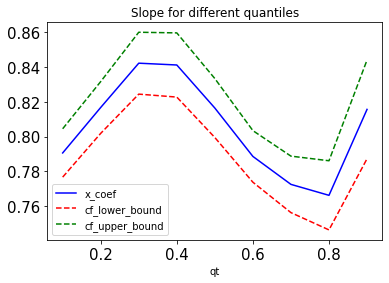

In [71]:
## Plot the changes in the quantile coeffiecients
# 
plt.figure(6)
params.plot(x = 'qt', y = ['x_coef','cf_lower_bound', 'cf_upper_bound'], 
	title = 'Slope for different quantiles', kind ='line', style = ['b-','r--','g--'])
plt.show()

# Lasso Regression

In [73]:
#Creating target and features
X = hass.drop(['price'],axis=1)
y = hass['price']
from sklearn.model_selection import train_test_split

#split data into test and train datasets
X_train,X_test,y_train,y_test = train_test_split(X, y, random_state=10)

In [77]:
from sklearn.preprocessing import StandardScaler
    
columns = ['bedrooms','bathrooms','sqft_living','sqft_lot','floors','condition','grade','sqft_above','sqft_basement','yr_built','zipcode','sqft_living15','sqft_lot15']
# Create Scaler Object
scaled_data = StandardScaler()

# Fit and transform Data to Scaler Object
X_train_scaled = scaled_data.fit_transform(X_train)
X_test_scaled = scaled_data.transform(X_test)


#view the scaled data
print('Original Data')
display(hass.head())

# Print separator dashes and view data
print('-'*100)
print('Transformed Data')
pd.DataFrame(X_train_scaled, columns=columns).head()

Original Data


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,sqft_living15,sqft_lot15
0,12.309982,3,1.00,7.073270,5650,1.0,3,7,1180,0,1955,98178,1340,5650
1,13.195614,3,2.25,7.851661,7242,2.0,3,7,2170,400,1951,98125,1690,7639
2,12.100712,2,1.00,6.646391,10000,1.0,3,6,770,0,1933,98028,2720,8062
3,13.311329,4,3.00,7.580700,5000,1.0,5,7,1050,910,1965,98136,1360,5000
4,13.142166,3,2.00,7.426549,8080,1.0,3,8,1680,0,1987,98074,1800,7503


----------------------------------------------------------------------------------------------------
Transformed Data


,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,sqft_living15,sqft_lot15
0,0.751052,0.564811,1.377098,0.743524,0.943739,-0.631525,2.047430,1.987023,-0.656579,1.127179,-1.270218,2.020642,0.966041
1,-0.405334,-0.124746,-0.425029,-0.242067,0.943739,-0.631525,-0.555230,-0.240268,-0.656579,1.195403,-0.670949,0.440686,-0.284120
2,-1.561721,-0.124746,-0.802271,-0.298697,-0.913256,0.906210,0.312323,-0.529690,-0.656579,0.103806,-0.483678,-0.268080,-0.372070
3,-0.405334,-1.503859,-0.820100,-0.187842,0.015241,-0.631525,-0.555230,-0.542274,-0.656579,-0.612554,0.883405,-0.223782,-0.218445
4,0.751052,-0.469524,-0.350321,-0.170389,-0.913256,-0.631525,-0.555230,-0.177350,-0.656579,-0.407880,-0.876948,-0.519101,-0.186797


# Creating a Lasso Regression with Alpha = 1

In [78]:
from sklearn.metrics import mean_squared_error, mean_squared_log_error
from sklearn.linear_model import Lasso

# Lasso is also known as the L1 norm 
# Default alpha value is 1
lasso = Lasso(alpha=1, max_iter=10000, random_state=0, tol=0.01) 
lasso.fit(X_train_scaled, y_train)

# See how many variables were removed
print(f'There are {len(lasso.coef_)} total parameters')
print(f'There have been {sum((abs(lasso.coef_) > 0))} features removed with an alpha value of {lasso.alpha}')
print(f'There are {100 - sum(abs(lasso.coef_) < 10**(-10))/ len(lasso.coef_)*100:.3}% of the original parameters')
print('-'*100)

# Print R2 and MSE for training and test sets round to the nearest .001
print(f'Training r^2: {lasso.score(X_train_scaled, y_train):.3f}')
print(f'Test r^2: {lasso.score(X_test_scaled, y_test): .3f}')
print(f'Training MSE: {mean_squared_error(y_train, lasso.predict(X_train_scaled)): .3f}')
print(f'Test MSE: {mean_squared_error(y_test, lasso.predict(X_test_scaled)): .3f}')

There are 13 total parameters
There have been 0 features removed with an alpha value of 1
There are 0.0% of the original parameters
----------------------------------------------------------------------------------------------------
Training r^2: 0.000
Test r^2: -0.000
Training MSE:  0.267
Test MSE:  0.258


In [79]:
from sklearn.linear_model import Ridge


# Ridge is also known as the L2 norm
# Alpha default is 1.0
ridge = Ridge(alpha= 1,random_state = 1)
ridge.fit(X_train_scaled, y_train)

print(f'Training r^2: {ridge.score(X_train_scaled, y_train):.3f}')
print(f'Test r^2: {ridge.score(X_test_scaled, y_test): .3f}')
print(f'Training MSE: {mean_squared_error(y_train, ridge.predict(X_train_scaled)): .3f}')
print(f'Test MSE: {mean_squared_error(y_test, ridge.predict(X_test_scaled)): .3f}')

Training r^2: 0.637
Test r^2:  0.633
Training MSE:  0.097
Test MSE:  0.095


# Ridge Regression with Alpha = 1

# Finding Optimized Lasso Alpha Value

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

The optimal alpha value is :1.0256779307444208e-10


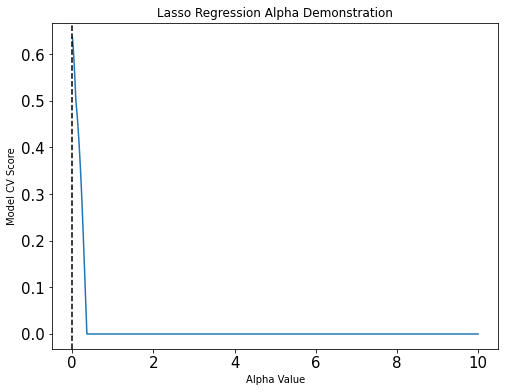

In [80]:
from sklearn.model_selection import GridSearchCV

# Create an array of alpha values to test
# Start np.linspace value is 10**-10 because a value of 0 throws warnings
alphas = np.logspace(-10, 1, 1000,base=10)

# Create dictionary key,value pair of alpha values
tuned_parameters = [{'alpha': alphas}]

# Specify number of folds for cross_validation
n_folds = 5

# Create grid search instance using desired variables
clf_lasso = GridSearchCV(lasso, tuned_parameters, cv=5, refit=True)
clf_lasso.fit(X_train_scaled, y_train)
lasso_scores = clf_lasso.cv_results_['mean_test_score']

# Plot the results
plt.figure().set_size_inches(8, 6)
plt.plot(alphas, lasso_scores)
plt.xlabel('Alpha Value')
plt.ylabel('Model CV Score')
plt.title('Lasso Regression Alpha Demonstration')
plt.axvline(clf_lasso.best_params_['alpha'], color='black', linestyle='--')
print(f'The optimal alpha value is :{clf_lasso.best_params_["alpha"]}')

# Creating Optimized Lasso Regression

In [81]:

# Set alpha = optimized alpha value
lasso_optimized_alpha = clf_lasso.best_params_['alpha']

# Default alpha value is 1
lasso = Lasso(alpha=lasso_optimized_alpha,random_state=1) 
lasso.fit(X_train_scaled, y_train)

# See how many variables were removed
print(f'There are {len(lasso.coef_)} total parameters')
print(f'There have been {sum((abs(lasso.coef_) > 0))} features removed with an alpha value of {lasso.alpha}')
print(f'There are {100 - sum(abs(lasso.coef_) < 10**(-10))/ len(lasso.coef_)*100:.4}% of the original parameters')
print('-'*100)

# Print R2 and MSE for training and test sets round to the nearest .001
print(f'Training r^2: {lasso.score(X_train_scaled, y_train):.3f}')
print(f'Test r^2: {lasso.score(X_test_scaled, y_test): .3f}')
print(f'Training MSE: {mean_squared_error(y_train, lasso.predict(X_train_scaled)): .3f}')
print(f'Test MSE: {mean_squared_error(y_test, lasso.predict(X_test_scaled)): .3f}')

There are 13 total parameters
There have been 13 features removed with an alpha value of 1.0256779307444208e-10
There are 100.0% of the original parameters
----------------------------------------------------------------------------------------------------
Training r^2: 0.637
Test r^2:  0.633
Training MSE:  0.097
Test MSE:  0.095


# Finding Optimized Ridge Alpha Value

The optimal alpha value is: 13.159472381989154


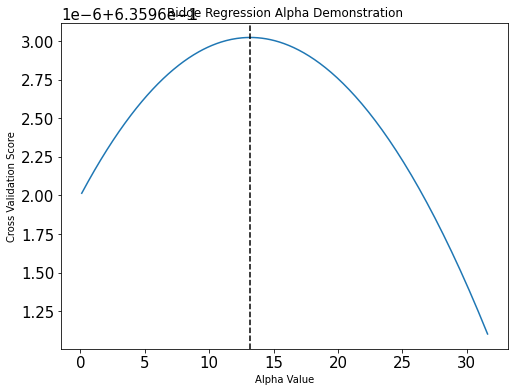

In [82]:
#from sklearn.model_selection import Ridge
from sklearn.linear_model import RidgeCV

# Create an array of alpha values to test
alphas = np.logspace(-1, 1.5, 500,base=10)

# Create a Ridge model instance
ridge = Ridge(random_state=0, max_iter=10000,alpha=alphas)


# Create dictionary key,value pair of alpha values
tuned_parameters = [{'alpha': alphas}]

# Specify number of folds for cross_validation
n_folds = 5

# Create grid search instance using desired variables
clf_ridge = GridSearchCV(ridge, tuned_parameters, cv=5, refit=False)
clf_ridge.fit(X_train_scaled, y_train)
ridge_scores = clf_ridge.cv_results_['mean_test_score']

# Plot the Figure
plt.figure().set_size_inches(8, 6)
plt.plot(alphas, ridge_scores)
plt.xlabel('Alpha Value')
plt.ylabel('Cross Validation Score')
plt.title('Ridge Regression Alpha Demonstration')
plt.axvline(clf_ridge.best_params_['alpha'], color='black', linestyle='--')
print(f'The optimal alpha value is: {clf_ridge.best_params_["alpha"]}')

# Creating Optimized Ridge Regression

In [83]:
# Set alpha = optimized alpha value
ridge_optimized_alpha = clf_ridge.best_params_['alpha']

# Default alpha value is 1
ridge = Ridge(alpha=ridge_optimized_alpha,random_state=1) 
ridge.fit(X_train_scaled, y_train)

# Print R2 and MSE for training and test sets round to the nearest .001
print(f'Training r^2: {ridge.score(X_train_scaled, y_train):.3f}')
print(f'Test r^2: {ridge.score(X_test_scaled, y_test): .3f}')
print(f'Training MSE: {mean_squared_error(y_train, ridge.predict(X_train_scaled)): .3f}')
print(f'Test MSE: {mean_squared_error(y_test, ridge.predict(X_test_scaled)): .3f}')

Training r^2: 0.637
Test r^2:  0.633
Training MSE:  0.097
Test MSE:  0.095


## Results of Optimized Models

In [84]:
# Ridge Regression
print('Ridge Regression')
print(f'Test r^2: {ridge.score(X_test_scaled, y_test): .3f}')
print(f'Test MSE: {mean_squared_error(y_test, ridge.predict(X_test_scaled)): .3f}')

print('*'*100)

# Lasso Regression 
print('Lasso Regression')
print(f'Test r^2: {lasso.score(X_test_scaled, y_test): .3f}')
print(f'Test MSE: {mean_squared_error(y_test, lasso.predict(X_test_scaled)): .3f}')

print('*'*100)

Ridge Regression
Test r^2:  0.633
Test MSE:  0.095
****************************************************************************************************
Lasso Regression
Test r^2:  0.633
Test MSE:  0.095
****************************************************************************************************


## Elastic Net Regression 

In [87]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

In [85]:
# Creating our linear regression model for the purpose of comparison
# 
regression=LinearRegression()
regression.fit(X,y)
first_model=(mean_squared_error(y_true=y,y_pred=regression.predict(X)))
print(first_model) 

# This mean standard error score of 0.964 is our benchmark for determining 
# if the elastic net model will be better or worst. 

0.09635529561035391


In [86]:
# Below are the coefficients of this first model. We use a for loop to go through 
# the model and the zip function to combine the two columns.
# 
coef_dict_baseline = {}
for coef, feat in zip(regression.coef_,X.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline

{'bedrooms': -0.04281279876425062,
 'bathrooms': 0.08125461036564179,
 'sqft_living': 0.17429204755370456,
 'sqft_lot': 2.886206863089713e-07,
 'floors': 0.11492605676429599,
 'condition': 0.04361438107144509,
 'grade': 0.20804521085941347,
 'sqft_above': 4.1665729424187475e-05,
 'sqft_basement': 0.0001370135785403251,
 'yr_built': -0.005633632718787184,
 'zipcode': 0.00043531357875435385,
 'sqft_living15': 0.00012796874741087885,
 'sqft_lot15': -4.7584885932983045e-07}

In [88]:
# Elastic Net Model
# Elastic net, just like ridge and lasso regression, requires normalize data. 
# This argument  is set inside the ElasticNet function. 
# The second thing we need to do is create our grid.
# 
elastic=ElasticNet(normalize=True)
search=GridSearchCV(estimator=elastic,param_grid={'alpha':np.logspace(-5,2,8),'l1_ratio':[.2,.4,.6,.8]},scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)

In [89]:
# We will now fit our model and display the best parameters and the best results we can get with that setup.
# 
search.fit(X,y)
search.best_params_
abs(search.best_score_)

0.0976070390744992

In [90]:
# The best hyperparameters was an alpha set to 0.001 and a l1_ratio of 0.8. 
# With these settings we got an MSE of 0.097. This is above our baseline model of MSE 0.0996  for the baseline model. 
# Which means that elastic net is doing worse than linear regression. 
# For clarity, we will set our hyperparameters to the recommended values and run on the data.
# 
elastic=ElasticNet(normalize=True,alpha=0.001,l1_ratio=0.75)
elastic.fit(X,y)
second_model=(mean_squared_error(y_true=y,y_pred=elastic.predict(X)))
print(second_model)

0.20125142700781717


In [91]:
# Below are the coefficients
# 
coef_dict_baseline = {}
for coef, feat in zip(elastic.coef_,X.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline

# The coefficients are mostly the same. 
# Notice that yr_built was completely removed from the model in the elastic net version. 
# This means that this values was no good to the algorithm. Traditional regression cannot do this.

{'bedrooms': 0.0017649544924860814,
 'bathrooms': 0.021091722746354378,
 'sqft_living': 0.06195713263022118,
 'sqft_lot': 0.0,
 'floors': 9.571287626977128e-05,
 'condition': 0.0,
 'grade': 0.025633460849793937,
 'sqft_above': 2.3864653687444442e-05,
 'sqft_basement': 8.24539929016466e-06,
 'yr_built': -0.0,
 'zipcode': 0.0,
 'sqft_living15': 3.307209143304456e-05,
 'sqft_lot15': 0.0}

## Follow up questions
> At this point, we can refine our question or collect new data, all in an iterative process to get at the truth.

### a). Did we have the right data?
> - I do not think we had the right amount of data needed for such an analysis.

### b). Do we need other data to answer our question?
> - Yes we do need for better predictions.

### c). Did we have the right question?
> - Yes we did.

### Conclusions
> - Houses range from average condition
  - House prices have been increasing over the years 
  - The higher the grade the more costly the house is 
  - Our models were able to predict prices with a substantial amount of accuracy
  - If we had proper data collected the models would perform better.